<a href="https://colab.research.google.com/github/Kac147/Research/blob/master/MyModel.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install -Uqq fastbook
import fastbook
fastbook.setup_book()

     |████████████████████████████████| 727kB 5.1MB/s 
     |████████████████████████████████| 194kB 23.2MB/s 
     |████████████████████████████████| 51kB 7.7MB/s 
     |████████████████████████████████| 1.0MB 23.1MB/s 
     |████████████████████████████████| 51kB 7.8MB/s 
     |████████████████████████████████| 51kB 8.4MB/s 
     |████████████████████████████████| 40kB 7.2MB/s 
     |████████████████████████████████| 92kB 13.0MB/s 
     |████████████████████████████████| 61kB 9.2MB/s 
     |████████████████████████████████| 51kB 9.2MB/s 
     |████████████████████████████████| 2.6MB 41.8MB/s 
Mounted at /content/gdrive


In [2]:
from fastbook import *
from fastai.vision.widgets import *

In [3]:
key = os.environ.get('AZURE_SEARCH_KEY', 'e970462868db43129beee20746d1c173')

In [4]:
results = search_images_bing(key, 'gothic church')
ims = results.attrgot('content_url')
len(ims)

150

In [5]:
os.mkdir('images')

In [6]:
dest = 'images/church.jpg'
download_url(ims[0], dest)

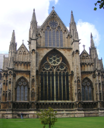

In [7]:
im = Image.open(dest)
im.to_thumb(128,128)

In [8]:
church_types = 'romanesque','gothic','renaissance'
path = Path('churches')

In [9]:
if not path.exists():
    path.mkdir()
    for o in church_types:
        dest = (path/o)
        dest.mkdir(exist_ok=True)
        results = search_images_bing(key, f'{o} church')
        download_images(dest, urls=results.attrgot('content_url'))

In [10]:
fns = get_image_files(path)
fns

(#448) [Path('churches/romanesque/00000034.jpg'),Path('churches/romanesque/00000104.jpg'),Path('churches/romanesque/00000000.jpg'),Path('churches/romanesque/00000055.jpg'),Path('churches/romanesque/00000138.jpg'),Path('churches/romanesque/00000010.jpg'),Path('churches/romanesque/00000016.jpg'),Path('churches/romanesque/00000048.jpg'),Path('churches/romanesque/00000123.jpg'),Path('churches/romanesque/00000137.jpeg')...]

In [11]:
failed = verify_images(fns)
failed

(#9) [Path('churches/romanesque/00000088.jpg'),Path('churches/romanesque/00000011.JPG'),Path('churches/romanesque/00000115.jpg'),Path('churches/romanesque/00000006.JPG'),Path('churches/romanesque/00000017.jpg'),Path('churches/gothic/00000111.jpg'),Path('churches/gothic/00000094.jpg'),Path('churches/gothic/00000005.jpg'),Path('churches/renaissance/00000068.jpg')]

In [12]:
failed.map(Path.unlink);

In [13]:
churches = DataBlock(
    blocks=(ImageBlock,CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128))

In [14]:
dls=churches.dataloaders(path)

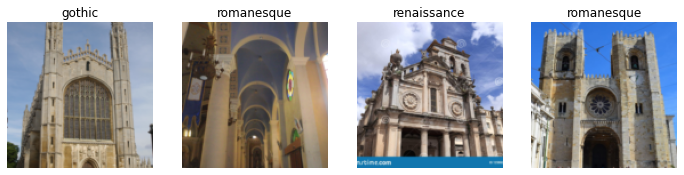

In [15]:
dls.valid.show_batch(max_n=4, nrows=1)

In [23]:
churches = churches.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls=churches.dataloaders(path)

In [24]:
learn = cnn_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

epoch,train_loss,valid_loss,error_rate,time
0,2.102902,1.492754,0.540230,00:18


epoch,train_loss,valid_loss,error_rate,time
0,1.217147,0.994230,0.425287,00:19
1,0.999720,0.802120,0.264368,00:18
2,0.877277,0.818494,0.310345,00:19
3,0.798841,0.798637,0.298851,00:18


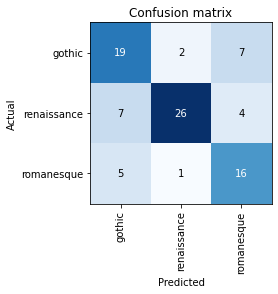

In [25]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

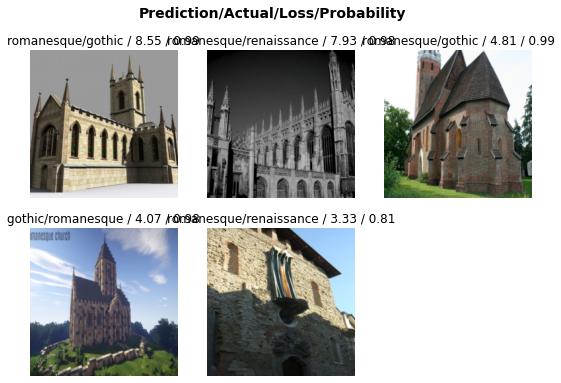

In [26]:
interp.plot_top_losses(5)

In [28]:
cleaner = ImageClassifierCleaner(learn)
cleaner

In [29]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
for idx,cat in cleaner.change(): 
    real_dst = os.path.join(path/cat, cleaner.fns[idx].name)
    if os.path.exists(real_dst):
        old_file_path = cleaner.fns[idx]
        old_cat = old_file_path.parent.stem
        new_file_path = f'{path/cat/old_cat}_{str(old_file_path.name.replace(" ","").lower())}'
        shutil.move(str(cleaner.fns[idx]), new_file_path)
    else:
        shutil.move(str(cleaner.fns[idx]), path/cat)

In [30]:
dls=churches.dataloaders(path)

In [31]:
learn2 = cnn_learner(dls, resnet18, metrics=error_rate)
learn2.fine_tune(4)

epoch,train_loss,valid_loss,error_rate,time
0,1.727695,0.946852,0.441860,00:19


epoch,train_loss,valid_loss,error_rate,time
0,1.137061,0.792250,0.383721,00:20
1,1.008708,0.718952,0.302326,00:20
2,0.839794,0.744637,0.220930,00:19
3,0.773992,0.763158,0.232558,00:20


In [32]:
cleaner2 = ImageClassifierCleaner(learn2)
cleaner2

In [ ]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
for idx,cat in cleaner.change(): 
    real_dst = os.path.join(path/cat, cleaner.fns[idx].name)
    if os.path.exists(real_dst):
        old_file_path = cleaner.fns[idx]
        old_cat = old_file_path.parent.stem
        new_file_path = f'{path/cat/old_cat}_{str(old_file_path.name.replace(" ","").lower())}'
        shutil.move(str(cleaner.fns[idx]), new_file_path)
    else:
        shutil.move(str(cleaner.fns[idx]), path/cat)

In [33]:
# now, we're going to export the "final" model

learn.export()

In [34]:
# Check if the file exists:

path = Path()
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]

In [35]:
learn_inf = load_learner(path/'export.pkl')

In [37]:
# this is used to actually predict with our model
 
learn_inf.predict('images/church.jpg')

('gothic', tensor(0), tensor([0.9681, 0.0273, 0.0045]))

In [38]:
btn_upload = widgets.FileUpload()
btn_upload

FileUpload(value={}, description='Upload')

In [39]:
img = PILImage.create(btn_upload.data[-1])

In [40]:
out_pl = widgets.Output()
out_pl.clear_output()
with out_pl: display(img.to_thumb(128,128))
out_pl

Output()

In [41]:
pred, pred_idx, probs = learn_inf.predict(img)

In [43]:
lbl_pred = widgets.Label()
lbl_pred.value = f"prediction: {pred}; probability: {probs[pred_idx]:.04f}"
lbl_pred

Label(value='prediction: romanesque; probability: 0.9152')

In [44]:
btn_run = widgets.Button(description='Classify')
btn_run

Button(description='Classify', style=ButtonStyle())

In [45]:
def on_click_classify(change):
    img = PILImage.create(btn_upload.data[-1])
    out_pl.clear_output()
    with out_pl: display(img.to_thumb(128,128))
    pred,pred_idx,probs = learn_inf.predict(img)
    lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'

btn_run.on_click(on_click_classify)

In [46]:
btn_upload = widgets.FileUpload()

In [47]:
VBox([widgets.Label('Select your church (romanesque, gothic, renaissance)'),
      btn_upload, btn_run, out_pl, lbl_pred])

In [48]:
!pip install voila
!jupyter serverextension enable voila —sys-prefix

     |████████████████████████████████| 6.9MB 4.0MB/s 
     |████████████████████████████████| 204kB 45.4MB/s 
     |████████████████████████████████| 112kB 53.1MB/s 
     |████████████████████████████████| 552kB 49.2MB/s 
ERROR: nbdev 1.1.4 has requirement nbconvert<6, but you'll have nbconvert 6.0.7 which is incompatible.
  Found existing installation: jupyter-client 5.3.5
    Uninstalling jupyter-client-5.3.5:
      Successfully uninstalled jupyter-client-5.3.5
  Found existing installation: nbconvert 5.6.1
    Uninstalling nbconvert-5.6.1:
      Successfully uninstalled nbconvert-5.6.1


Enabling: voila
- Writing config: /root/.jupyter
    - Validating...
Error loading server extension voila
      X is voila importable?
Enabling: —sys-prefix
- Writing config: /root/.jupyter
    - Validating...
Error loading server extension —sys-prefix
      X is —sys-prefix importable?
